The purpose of this notebook is to setup a pipeline that can use parallelization and run all 4 codebases on multiple audio files. Results will be archived in a specific directory structure as discussed.

This code runs full 5 min audio files without any chunking.

In [1]:
import multiprocessing
from multiprocessing import Pool
import pandas as pd
import os
import dask
import socket
from dask_jobqueue import SLURMCluster
from  distributed import Client
import subprocess
from dask import delayed, compute
import glob
import json
import numpy as np
import time
from sklearn.metrics import mean_squared_error  
import math  
import warnings
import pypandoc
import jiwer
warnings.simplefilter(action='ignore', category=FutureWarning)
!module load openmind/ffmpeg/20160310 

codebasenameoptions = ['yinruiqing', 'speechbox', 'ashraf', 'whisperx']  
codebase_mapping_dict = {1: 'yinruiqing', 2: 'speechbox', 3: 'ashraf',4: 'whisperx'}

In [3]:
#AUDIO_FILE_NAMES = [ '34_KS_Recording4-LR_2165-2465_CT.wav',  'Alex_030119_first5.wav']

#folder based-run of this pipeline 
#use glob itself

box_set_9 = [ 
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_3144-3444_CT.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_2465-2765_CT.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording2-LR_22826-23126_CT.wav',
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_9444-9744_CT.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_9365-9665_CT.wav',
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_2244-2544_CT.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording1-LR_2662-2962_CT.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording1-LR_2962-3262_CT.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_2165-2465_CT.wav'
 ]
childes_random_10 = ['/om/user/arjunp/rawAudioFiles/Ethan_021005_first5.wav', '/om/user/arjunp/rawAudioFiles/Lily_030725_first5.wav', '/om/user/arjunp/rawAudioFiles/William_030011_first5.wav', '/om/user/arjunp/rawAudioFiles/Naima_020720_first5.wav', '/om/user/arjunp/rawAudioFiles/Naima_010801_first5.wav', '/om/user/arjunp/rawAudioFiles/William_011115_first5.wav', '/om/user/arjunp/rawAudioFiles/Violet_030119_first5.wav',   '/om/user/arjunp/rawAudioFiles/Ethan_020208_first5.wav', '/om/user/arjunp/rawAudioFiles/Alex_010526_first5.wav', '/om/user/arjunp/rawAudioFiles/Lily_040002_first5.wav']
AUDIO_FILE_NAMES = childes_random_10 + box_set_9

In [14]:
glob.glob('/om/user/arjunp/rawAudioFiles/*.wav')

['/om/user/arjunp/rawAudioFiles/first_min_030327.wav',
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_3144-3444_CT.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_2465-2765_CT.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording2-LR_22826-23126_CT.wav',
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_9444-9744_CT.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_9365-9665_CT.wav',
 '/om/user/arjunp/rawAudioFiles/afjiv.wav',
 '/om/user/arjunp/rawAudioFiles/Alex_030119_first5.wav',
 '/om/user/arjunp/rawAudioFiles/030327.wav',
 '/om/user/arjunp/rawAudioFiles/34_KS_Recording4-LR_2165-2465_CT.wav',
 '/om/user/arjunp/rawAudioFiles/85_NA_Recording1-LR_2244-2544_CT.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording1-LR_2662-2962_CT.wav',
 '/om/user/arjunp/rawAudioFiles/third_min_030327.wav',
 '/om/user/arjunp/rawAudioFiles/40_JC_Recording1-LR_2962-3262_CT.wav',
 '/om/user/arjunp/rawAudioFiles/second_min_030327.wav']

In [4]:
def codebaseCommand(codebase_id, audiopath, specific_csv_path,**params):
    
    # TO DO: parse kwargs and pass them to the command and then update the cb scripts; and then change to argparse inside

    if codebase_id == 1:
        command = ['python', 'yinruiqing_trial.py', audiopath,specific_csv_path]
        
    elif codebase_id == 2:
        command = ['python', 'speechbox_trial.py', audiopath,specific_csv_path]  
         
    elif codebase_id == 3:
        command = ['python', '/om/user/arjunp/ashraf_repo/whisper-diarization/diarize.py','-a',audiopath] 
        srtpath = audiopath[:-4] +".srt" 
         
        command2 = ['python', '/om/user/arjunp/process_ashraf_output.py', srtpath,specific_csv_path]  
    else:
        command = ['python', 'whisperx_demo.py',audiopath,specific_csv_path]

    result = subprocess.run(command, capture_output=True, text=True)
         

    if codebase_id == 3:
        result2 = subprocess.run(command2, capture_output=True, text=True)
        return result, result2
    else: 
        return result    
         

In [5]:
def runCodebase(codebase_id, audiofilepaths, unixtime , **params):

    result_list = []

    codebasenameoptions = ['yinruiqing', 'speechbox', 'ashraf', 'whisperx']
    codebasename = codebasenameoptions[codebase_id-1]

    if codebase_id==1:
        cluster = SLURMCluster(cores=8,
                       processes=2,
                       memory="16GB",
                       account="cpl",
                       walltime="01:00:00",
                       queue="normal",
                       job_script_prologue  =[
                        'source /etc/profile.d/modules.sh' ,
                        'module load openmind8/anaconda/3-2023.09-0',
                        'module load openmind/gcc/11.1.0',
                        'module load openmind/ffmpeg/20160310' , 
                        'source ~/.bashrc',
                        'export MKL_THREADING_LAYER=GNU',
                        'conda activate torch_gpu'
                                              ],
                       job_extra_directives=['--gres=gpu:QUADRORTX6000:1'] 
                       )
        cluster.scale(3)
        #cluster.adapt()
        client = Client(cluster)

    elif codebase_id ==2:
       
        cluster = SLURMCluster(cores=8,
                       processes=2,
                       memory="16GB",
                       account="cpl",
                       walltime="01:00:00",
                       queue="normal",
                       job_script_prologue  =[
                        'source /etc/profile.d/modules.sh' ,
                        'module load openmind8/anaconda/3-2023.09-0',
                        'module load openmind/gcc/11.1.0',
                        'module load openmind/ffmpeg/20160310' , 
                        'source ~/.bashrc',
                        'export MKL_THREADING_LAYER=GNU',
                        'conda activate torch_gpu'
                                              ],
                       job_extra_directives=['--gres=gpu:QUADRORTX6000:1'] 
                       )
        cluster.scale(2)
        #cluster.adapt()
        client = Client(cluster)

    elif codebase_id==3:
        cluster = SLURMCluster(cores=8,
                       processes=2,
                       memory="16GB",
                       account="cpl",
                       walltime="01:00:00",
                       queue="normal",
                       job_script_prologue  =[
                        'source /etc/profile.d/modules.sh' ,
                        'module load openmind8/anaconda/3-2023.09-0',
                        'module load openmind/gcc/11.1.0',
                        'module load openmind8/ffmpeg/2023-05' , 'source ~/.bashrc',
                        'conda activate codebase3' 
                        #'cd /om/user/arjunp/ashraf_repo/whisper-diarization'
                                              ],
                       job_extra_directives=['--gres=gpu:QUADRORTX6000:1'] 
                       )
        cluster.scale(2)
        #cluster.adapt()
        client = Client(cluster)

    else: 
        cluster = SLURMCluster(cores=8,
                       processes=2,
                       memory="16GB",
                       account="cpl",
                       walltime="01:00:00",
                       queue="normal",
                       job_script_prologue  =[
                        'source /etc/profile.d/modules.sh' ,
                        'module load openmind8/anaconda/3-2023.09-0',
                        'module load openmind8/cuda/12.1',                 
                        'module load openmind8/cudnn/8.8.1-cuda12'  ,
                        'module load openmind/gcc/11.1.0',
                        'module load openmind/ffmpeg/20160310' , 
                        'source ~/.bashrc',
                        'conda activate whisperx'
                                              ],
                       job_extra_directives=['--gres=gpu:QUADRORTX6000:1'] 
                       )
        cluster.scale(2)
        #cluster.adapt()
        client = Client(cluster)

    print("set up cluster for cb", codebase_id )

    for audiopath in audiofilepaths:

        # -------- CREATING FILE STRUCTURE ---------------
        filename = os.path.basename(audiopath)[:-4]
        #unixtime = str(round(time.time()))
        unix_level = os.path.join('/om/user/arjunp/pipelineOutput',unixtime)
         
        if not os.path.exists(unix_level):
            os.makedirs(unix_level)
        
        cb_level = os.path.join(unix_level,codebasename)
        
        if not os.path.exists(cb_level):
            os.makedirs(cb_level)

        csv_to_save = filename+".csv"
        specific_path = os.path.join(cb_level, csv_to_save)


        future  = client.submit(codebaseCommand,codebase_id,audiopath,specific_path,**params)  
        result  = future.result()
        result_list.append(result)
        print("Ran codebase", codebase_id, "on", filename)

         # -------- CREATING METADATA JSON ---------------
        dictionary = {
                "csvname": csv_to_save,
                "codebase":  codebasename,
                "codebase_id": codebase_id,
                "audiofile": filename,
                "full_csv_path" : specific_path,
                "unix_time":unixtime,
                "parameters" : params }
 

        jsonpath = os.path.join(cb_level,  filename+".json")

        if os.path.exists(jsonpath):
            #read existing file and append new data
            with open(jsonpath,"r") as f:
                loaded = json.load(f)
            loaded.append(dictionary)
        else:
            #create new json
            loaded = [dictionary]

        #overwrite/create file
        with open(jsonpath,"w") as f:
            json.dump(loaded,f,indent=4)

    client.close() 
    cluster.close()
    
    return result_list
        

The block below actually runs all the codebases on all the audiofiles through dask.

In [6]:
%%time

audiofilepaths = [os.path.join('/om/user/arjunp/rawAudioFiles', os.path.basename(name_of_audio)) for name_of_audio in AUDIO_FILE_NAMES]

unixtimestamp = str(round(time.time()))

list_of_args = [(i+1, audiofilepaths,unixtimestamp) for i in range(4)]

with Pool(processes=12) as pool: 
    poolresult = pool.starmap(runCodebase, list_of_args)

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45003 instead
  warnings.warn(
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42523 instead
  warnings.warn(
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41279 instead
  warnings.warn(


set up cluster for cb 2
set up cluster for cb set up cluster for cb4 set up cluster for cb
1 3

Ran codebase 4 on Ethan_021005_first5
Ran codebase 1 on Ethan_021005_first5
Ran codebase 4 on Lily_030725_first5
Ran codebase 3 on Ethan_021005_first5
Ran codebase 2 on Ethan_021005_first5
Ran codebase 4 on William_030011_first5
Ran codebase 4 on Naima_020720_first5
Ran codebase 1 on Lily_030725_first5
Ran codebase 3 on Lily_030725_first5
Ran codebase 4 on Naima_010801_first5
Ran codebase 2 on Lily_030725_first5
Ran codebase 4 on William_011115_first5
Ran codebase 3 on William_030011_first5
Ran codebase 4 on Violet_030119_first5
Ran codebase 1 on William_030011_first5
Ran codebase 4 on Ethan_020208_first5
Ran codebase 3 on Naima_020720_first5
Ran codebase 4 on Alex_010526_first5
Ran codebase 2 on William_030011_first5
Ran codebase 4 on Lily_040002_first5
Ran codebase 1 on Naima_020720_first5
Ran codebase 4 on 85_NA_Recording1-LR_3144-3444_CT
Ran codebase 3 on Naima_010801_first5
Ran codebase

In [7]:
poolresult[1][1]

CompletedProcess(args=['python', 'speechbox_trial.py', '/om/user/arjunp/rawAudioFiles/Lily_030725_first5.wav', '/om/user/arjunp/pipelineOutput/1723004242/speechbox/Lily_030725_first5.csv'], returncode=0, stdout='Model was trained with pyannote.audio 0.0.1, yours is 3.3.1. Bad things might happen unless you revert pyannote.audio to 0.x.\nModel was trained with torch 1.10.0+cu102, yours is 2.3.1+cu118. Bad things might happen unless you revert torch to 1.x.\nRunning CB2: speechbox\n[{\'speaker\': \'SPEAKER_00\', \'text\': " Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Yup. Oh yes. Oh no. That was my first fish walnut. I\'m sorry. I\'m sorry. I\'m sorry.", \'timestamp\': (0.0, 63.0)}, {\'speaker\': \'SPEAKER_01\', \'text\': " I\'m sorry. Oh, shit. Oh What are you doing there? That\'s no good!", \'timestamp\': (108.0, 110.0)}, {\'speaker\': \'SPEAKER_00\', \'text\': " You\'re the sweetheart, sweetheart. I\'m the sweetheart, sweetheart. I\'m the sweetheart. Oh, they can 

Now it's time to round up all the json files created to make one big json file

In [8]:
def updateMyJson():
    jsons_to_combine=[]

    for filename in glob.glob('pipelineOutput/**/*.json', recursive=True):
        if  filename !="pipelineOutput/metadata.json":
            jsons_to_combine.append(filename)   


    combined_data = []

    # Iterate over each JSON file 
    for file_path in jsons_to_combine:
        with open(file_path, 'r') as f:
            data = json.load(f)
            combined_data.append(data)

    # Write the combined data to a new JSON file
    with open('pipelineOutput/metadata.json', 'w') as f:
        json.dump(combined_data, f, indent=4)

    print("All JSON files have been combined into 'metadata.json")

In [9]:
updateMyJson()

All JSON files have been combined into 'metadata.json


## Word count residual analysis

### Pre processing all gold standard transcripts

In [19]:
# Pre-processing all the gold standard transcripts
def createGoldTranscriptDataFrame(link, type):
    if type == 'CHILDES':
        og_df = pd.read_csv(link)
        try:
            filtered_df = og_df[[ 'speaker_code', 'speaker_role','text', 'media_start','media_end']]
        except:
            filtered_df = og_df[[ 'speaker_code', 'speaker_role','gloss', 'media_start','media_end']]
        filtered_df.columns = ['speaker_code', 'speaker_role','text', 'media_start','media_end']
    
    else:
        with open(link, "r") as file:
            script_content = file.read()

        parsed_data = parse_script(script_content)
        filtered_df = pd.DataFrame(parsed_data, columns=["speaker", "text"])

    filtered_df.to_csv(os.path.join('/om/user/arjunp/goldTranscripts', os.path.basename(link)[:-4]+".csv"), index=False)
    return filtered_df


    
directory='/om/user/arjunp/goldTranscripts' 
for filename in os.listdir(directory):
        if filename.endswith("_first5.csv"):
            file_path = os.path.join(directory, filename)
            #txt_filename = os.path.splitext(filename)[0] + ".txt"
            #txt_path = os.path.join(directory, txt_filename)
            createGoldTranscriptDataFrame(file_path, 'CHILDES')


# throw utility things in a py file and import it here

### Writing some utility/helper functions 

In [37]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
import glob



## Helper functions


def scrapeCBoutput(codebase_id, audiofilepath, unixtime):

    ''' 
    Function to scrape the csv output of a codebase and return the text output
    '''

    cb_alltext = []
    main_output_dir  = '/om/user/arjunp/pipelineOutput'
    audio_name = os.path.basename(audiofilepath)[:-4]

    codebasename = codebasenameoptions[codebase_id-1]

    csv_dir = os.path.join(main_output_dir, unixtime,codebasename)
    csv_path = os.path.join(csv_dir, audio_name+".csv")
    df = pd.read_csv(csv_path)
    cb_alltext.append(df['text'].astype(str).to_list())
     
    return cb_alltext


def parse_script(content):
    ''' 
    Function to scrape the srt script of a codebase
    '''

    lines = content.strip().split('\n')
    data = []
    for line in lines:
        match = re.match(r"(.+?): (.+)", line)
        if match:
            speaker = match.group(1).strip()
            dialogue = match.group(2).strip()
            data.append([speaker, dialogue])
    return data



def return_counts(corpus):
    ''' 
    Function to scrape token types and their frequencies from a corpus
    '''
    vectorizer = CountVectorizer(token_pattern=r'(?u)\b\w+\b')
    X = vectorizer.fit_transform(corpus)
    vocab = vectorizer.vocabulary_
    word_freq = X.toarray().sum(axis=0)
    word_freq_dict = {word: word_freq[idx] for word, idx in vocab.items()}
    return word_freq_dict


def createFullDataframe(name_of_audio, gold_transcript_path,unixtime): #evaluate for extensibility
    ''' 
    Function to create a dataframe comparing the gold standard transcript with the output of all codebases
    '''

    gold_standard_df = pd.read_csv(gold_transcript_path)
    gold_standard_counts = return_counts(gold_standard_df['text'])
    gold_df = pd.DataFrame(list(gold_standard_counts.items()) , columns=["token", "count"])
    all_scraped = []
    for i in range (1,5):
        all_scraped += scrapeCBoutput(i,name_of_audio,unixtime)   
     
    cb1_counts = return_counts(all_scraped[0])
    cb2_counts = return_counts(all_scraped[1])
    cb3_counts = return_counts(all_scraped[2])
    cb4_counts = return_counts(all_scraped[3])

    cb1_df = pd.DataFrame(list(cb1_counts.items()) , columns=["token", "count"])
    cb2_df = pd.DataFrame(list(cb2_counts.items()) , columns=["token", "count"])
    cb3_df = pd.DataFrame(list(cb3_counts.items()) , columns=["token", "count"])
    cb4_df = pd.DataFrame(list(cb4_counts.items()) , columns=["token", "count"])


    #loop this

    merge_step1 = pd.merge(gold_df, cb1_df, on='token', how='outer',suffixes=('_gold', '_cb1'))  
    merge_step2 = pd.merge(merge_step1, cb2_df, on='token', how='outer',suffixes=(None, '_cb2'))
    merge_step3 = pd.merge(merge_step2, cb3_df, on='token', how='outer',suffixes=(None, '_cb3'))
    merge_step4 = pd.merge(merge_step3, cb4_df, on='token', how='outer',suffixes=(None, '_cb4'))
    merge_step4.columns = ['token', 'count_gold', 'count_cb1', 'count_cb2','count_cb3', 'count_cb4']
    merge_step4.fillna(0, inplace=True)

    for i in range(1,5):
        merge_step4[f'count_cb{i}_residuals'] = merge_step4['count_gold'] - merge_step4[f'count_cb{i}']
        merge_step4[f'status_cb{i}'] = merge_step4[f'count_cb{i}_residuals'].apply(lambda x: 'undercount' if x > 0 else ('overcount' if x < 0 else 'exact'))
    merge_step4['audio'] = name_of_audio
    return merge_step4


def extractLatestTimestamp():
    subfolders = [int(f.name) for f in os.scandir('/om/user/arjunp/pipelineOutput') if f.is_dir()]
    return max(subfolders)

### Below cell has templates for different kinds of plots

In [118]:
def createSwarmPlots(list_of_audio, list_of_gold_transcripts,unixtimes):
    length = len(list_of_audio)
    list_of_dfs = []

    for i in range (length):
        list_of_dfs.append(createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i],unixtimes[i]))
    
    df = pd.concat(list_of_dfs)
    melted = pd.melt(df, value_vars=['count_cb1_residuals', 'count_cb2_residuals', 'count_cb3_residuals', 'count_cb4_residuals'],
                  var_name='value_name', value_name='counts', id_vars=['audio','status_cb1', 'status_cb2', 'status_cb3', 'status_cb4'])
    
    status= []
    for i in melted['counts']:
        if i>0:
            status.append('undercount')
        elif i<0:
            status.append('overcount')
        else:
            status.append('exact')

    melted['token_fate'] = status
    plt.figure(figsize=(8, 4))
    g = sns.FacetGrid(melted, col="value_name", row="audio",hue="token_fate", margin_titles=True, height=6, aspect=1  ,  palette={'undercount': 'blue', 'overcount': 'red', 'exact': 'green'})
    g.map(sns.swarmplot,  "counts",size=2.6,legend="full")
    g.set_titles(col_template="{col_name}", row_template="{row_name}" )
    plt.subplots_adjust(top=0.9)
    g.set_axis_labels("Residual", " ",fontsize=20)
    g.add_legend(title='Token fate',fontsize=16)
    g.fig.suptitle('Token count residuals per codebase, per audiofile',fontsize=24)
    plt.show()
    name_of_plot = "swarm_"+unixtimes[0]+".pdf"
    plt.savefig(name_of_plot, format='pdf')


def createLogLogPlots(list_of_audio, list_of_gold_transcripts, unixtimes): #basically don't need this option anymore
    sns.set(font_scale=2.5)
    sns.set_style("white")
    length = len(list_of_audio)
    list_of_dfs = []

    for i in range (length):
        list_of_dfs.append(createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i],unixtimes[i]))
    
    d1 = pd.concat(list_of_dfs)
    melted = pd.melt(d1, value_vars=['count_cb1', 'count_cb2', 'count_cb3', 'count_cb4'],
                  var_name='codebase', value_name='counts', id_vars=['audio','status_cb1', 'status_cb2', 'status_cb3', 'status_cb4'])

    melted['expected_counts'] = (list(d1['count_gold']) +   list(d1['count_gold']) + list(d1['count_gold'])  + list(d1['count_gold']) )
    melted['log(counts)'] = np.log(melted['counts']+1)
    melted['log(expected_counts)'] = np.log(melted['expected_counts']+1)
    g = sns.FacetGrid(melted, col="codebase", row="audio", margin_titles=True, height=12, aspect=1 )
    g.map(sns.scatterplot,   'log(expected_counts)',  'log(counts)', label = 'token',legend='full',alpha=0.3,color='black')
    g.map(sns.lineplot, 'log(expected_counts)', 'log(expected_counts)', color='red', linestyle ='--',legend='full',label='identity line')
    plt.subplots_adjust(top=0.9)
    g.set_axis_labels("Log(expected counts)", "Log(model counts)",fontsize=30)
    g.fig.suptitle('Log transformed: Expected vs model counts',fontsize=34)
    g.add_legend( )
    g.set_titles(col_template="{col_name}", row_template="{row_name}" )
    plt.show()


def createLogKDEPlots(list_of_audio, list_of_gold_transcripts, unixtimes): #dont use codebase numbers
    sns.set(font_scale=2.5)
    sns.set_style("white")
 
    length = len(list_of_audio)
    list_of_dfs = []

    for i in range (length):
        list_of_dfs.append(createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i],unixtimes[i]))
    
    d1 = pd.concat(list_of_dfs)
    
    melted = pd.melt(d1, value_vars=['count_cb1', 'count_cb2', 'count_cb3', 'count_cb4'],
                  var_name='codebase', value_name='counts', id_vars=['audio','status_cb1', 'status_cb2', 'status_cb3', 'status_cb4'])

    melted['expected_counts'] = (list(d1['count_gold']) +   list(d1['count_gold']) + list(d1['count_gold'])  + list(d1['count_gold']) )
    melted['log(counts)'] = np.log(melted['counts']+1)
    melted['log(expected_counts)'] = np.log(melted['expected_counts']+1)
    df_for_facet  = (melted.groupby(['codebase','audio','log(counts)','log(expected_counts)']).agg({'counts':['size']})).reset_index()
    unrolled_df = df_for_facet.loc[df_for_facet.index.repeat(df_for_facet['counts']['size'])].reset_index(drop=True)

    g = sns.FacetGrid(unrolled_df, col="codebase", row="audio", margin_titles=True, height=12, aspect=1 )
    g.map(sns.kdeplot,  'log(expected_counts)',   'log(counts)',  fill=True, thresh=0, levels=80, cmap="mako",bw_method=0.4)
    g.map(sns.lineplot, 'log(expected_counts)', 'log(expected_counts)', color='orange', linestyle ='--',legend='full',label='Ideal case')
    g.add_legend()
    plt.subplots_adjust(top=0.95)
    g.set_axis_labels("Log(expected counts)", "Log(model counts)",fontsize=30)
    g.fig.suptitle('Log transformed: model counts vs expected counts',fontsize=34)
    g.set_titles(col_template="Codebase no. : {col_name}", row_template="{row_name}" )
    plt.show()
    name_of_plot = "logKDE_"+unixtimes[0]+".pdf"
    plt.savefig(name_of_plot, format='pdf')
    return d1


#abandoned below style --- graveyard cell
'''def createFreqPlots(list_of_audio, list_of_gold_transcripts, sources):
    length = len(list_of_audio)
    list_of_dfs = []

    for i in range (length):
        list_of_dfs.append(createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i], sources[i]))
    
    d1  = pd.concat(list_of_dfs)
    melted = pd.melt(d1, value_vars=['count_cb1', 'count_cb2', 'count_cb3', 'count_cb4'],
                  var_name='value_name', value_name='counts', id_vars=['audio','status_cb1', 'status_cb2', 'status_cb3', 'status_cb4'])
    melted['expected_counts'] = (list(d1['count_gold']) +   list(d1['count_gold']) + list(d1['count_gold'])  + list(d1['count_gold']) )
    g = sns.FacetGrid(melted, col="value_name", row="audio", margin_titles=True, height=6, aspect=1.5)
    g.map(sns.scatterplot,   'expected_counts',  'counts', label = 'token')
    g.map(sns.lineplot, 'expected_counts', 'expected_counts', color='red', linestyle ='--',legend='auto',label='identity line')
    plt.subplots_adjust(top=0.9)
    g.set_axis_labels("Expected counts", "Model counts",fontsize=20)
    g.fig.suptitle('Expected vs model counts per codebase, per audiofile',fontsize=24)
    g.add_legend(fontsize=14)
    for ax in g.axes.flat:
        leg = ax.get_legend()
        if leg is not None:
            for text in leg.get_texts():
                text.set_fontsize(14)   
    plt.show()    '''

'def createFreqPlots(list_of_audio, list_of_gold_transcripts, sources):\n    length = len(list_of_audio)\n    list_of_dfs = []\n\n    for i in range (length):\n        list_of_dfs.append(createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i], sources[i]))\n    \n    d1  = pd.concat(list_of_dfs)\n    melted = pd.melt(d1, value_vars=[\'count_cb1\', \'count_cb2\', \'count_cb3\', \'count_cb4\'],\n                  var_name=\'value_name\', value_name=\'counts\', id_vars=[\'audio\',\'status_cb1\', \'status_cb2\', \'status_cb3\', \'status_cb4\'])\n    melted[\'expected_counts\'] = (list(d1[\'count_gold\']) +   list(d1[\'count_gold\']) + list(d1[\'count_gold\'])  + list(d1[\'count_gold\']) )\n    g = sns.FacetGrid(melted, col="value_name", row="audio", margin_titles=True, height=6, aspect=1.5)\n    g.map(sns.scatterplot,   \'expected_counts\',  \'counts\', label = \'token\')\n    g.map(sns.lineplot, \'expected_counts\', \'expected_counts\', color=\'red\', linestyle =\'--\',legend=\'

### Making swarm plots for the latest run

In [39]:
%%time #we can get rid of this function if we are using the generalized format
def createSwarmPlotsLatest():
    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_files = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    
    list_of_files = list(set([os.path.basename(file)[:-4]  for file in list_of_files]))
    list_of_audio =  [name+".wav" for name in list_of_files]
    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv")) 
    unixtimes = [latest_timestamp]*len(list_of_files)
    createSwarmPlots(list_of_audio, list_of_gold_transcripts,unixtimes)

UsageError: Can't use statement directly after '%%time'!


### Making log-log scatter plots for the latest run

In [6]:
def createLogPlotsLatest(sources): #we can get rid of this function  
    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_files = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files = list(set([os.path.basename(file)[:-4]  for file in list_of_files]))
    list_of_audio =  [name+".wav" for name in list_of_files]
    list_of_gold_transcripts = [os.path.join('/om/user/arjunp/goldTranscripts', name+".csv") for name in list_of_files]
    unixtimes = [latest_timestamp]*len(list_of_files)
    createLogLogPlots(list_of_audio, list_of_gold_transcripts, sources,unixtimes)
    
warnings.simplefilter(action='ignore', category=FutureWarning)
createLogPlotsLatest(['CHILDES','BOX'])

TypeError: createLogLogPlots() takes 3 positional arguments but 4 were given

### Making density plots for the latest run

In [40]:
def createLogKDELatest(): #we can get rid of this function if we are using the generalized format#we can get rid of this function if we are using the generalized format
    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_files = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files = list(set([os.path.basename(file)[:-4]  for file in list_of_files]))
    list_of_audio =  [name+".wav" for name in list_of_files]
    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv"))
    unixtimes = [latest_timestamp]*len(list_of_files)
    fulldf = createLogKDEPlots(list_of_audio, list_of_gold_transcripts,unixtimes)
    return fulldf 

In [9]:
createLogKDELatest()

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


,token,count_gold,count_cb1,count_cb2,count_cb3,count_cb4,count_cb1_residuals,status_cb1,count_cb2_residuals,status_cb2,count_cb3_residuals,status_cb3,count_cb4_residuals,status_cb4,audio
0,did,13.0,14.0,13.0,12.0,12.0,-1.0,overcount,0.0,exact,1.0,undercount,1.0,undercount,34_KS_Recording4-LR_2465-2765_CT.wav
1,x,3.0,0.0,0.0,0.0,0.0,3.0,undercount,3.0,undercount,3.0,undercount,3.0,undercount,34_KS_Recording4-LR_2465-2765_CT.wav
2,come,3.0,3.0,2.0,3.0,2.0,0.0,exact,1.0,undercount,0.0,exact,1.0,undercount,34_KS_Recording4-LR_2465-2765_CT.wav
3,nope,4.0,4.0,5.0,4.0,4.0,0.0,exact,-1.0,overcount,0.0,exact,0.0,exact,34_KS_Recording4-LR_2465-2765_CT.wav
4,oh,7.0,14.0,9.0,11.0,9.0,-7.0,overcount,-2.0,overcount,-4.0,overcount,-2.0,overcount,34_KS_Recording4-LR_2465-2765_CT.wav
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210,what,0.0,0.0,2.0,0.0,0.0,0.0,exact,-2.0,overcount,0.0,exact,0.0,exact,Ethan_020208_first5.wav
211,branch,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,Ethan_020208_first5.wav
212,soft,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,Ethan_020208_first5.wav
213,bench,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,Ethan_020208_first5.wav


/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


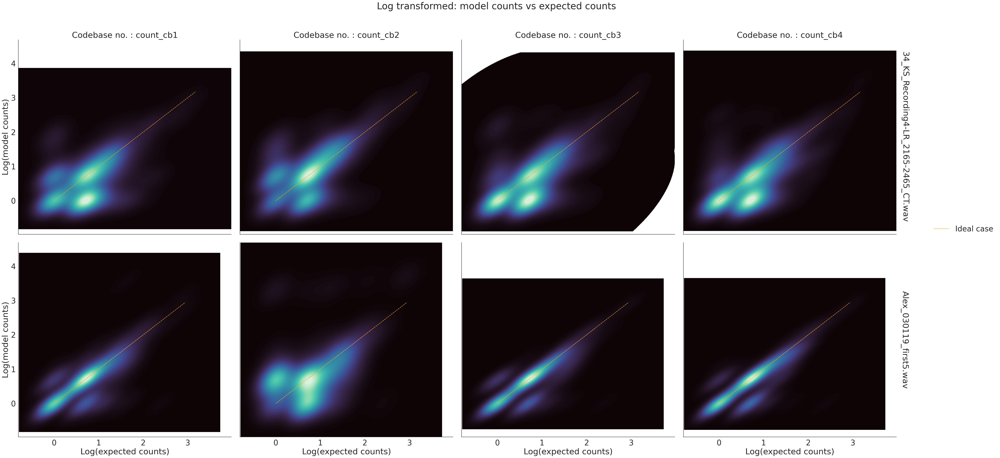

In [104]:
warnings.simplefilter(action='ignore', category=FutureWarning)
df_with_types = createLogKDELatest(['CHILDES','BOX']) 

In [11]:
createLogKDELatest() 

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


,token,count_gold,count_cb1,count_cb2,count_cb3,count_cb4,count_cb1_residuals,status_cb1,count_cb2_residuals,status_cb2,count_cb3_residuals,status_cb3,count_cb4_residuals,status_cb4,audio
0,i,26.0,32.0,35.0,26.0,23.0,-6.0,overcount,-9.0,overcount,0.0,exact,3.0,undercount,85_NA_Recording1-LR_3144-3444_CT.wav
1,m,12.0,13.0,23.0,12.0,11.0,-1.0,overcount,-11.0,overcount,0.0,exact,1.0,undercount,85_NA_Recording1-LR_3144-3444_CT.wav
2,going,13.0,13.0,22.0,11.0,11.0,0.0,exact,-9.0,overcount,2.0,undercount,2.0,undercount,85_NA_Recording1-LR_3144-3444_CT.wav
3,to,17.0,18.0,27.0,15.0,15.0,-1.0,overcount,-10.0,overcount,2.0,undercount,2.0,undercount,85_NA_Recording1-LR_3144-3444_CT.wav
4,make,7.0,7.0,7.0,7.0,8.0,0.0,exact,0.0,exact,0.0,exact,-1.0,overcount,85_NA_Recording1-LR_3144-3444_CT.wav
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231,pickle,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,40_JC_Recording2-LR_22826-23126_CT.wav
232,cabin,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,40_JC_Recording2-LR_22826-23126_CT.wav
233,box,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,40_JC_Recording2-LR_22826-23126_CT.wav
234,statement,0.0,0.0,0.0,1.0,0.0,0.0,exact,0.0,exact,-1.0,overcount,0.0,exact,40_JC_Recording2-LR_22826-23126_CT.wav


## Generalized function for making plots from the latest run

In [115]:
def createLatestPlots(kind):
    ''' 
    Function to create plots after pulling data from the latest run of the pipeline (i.e. the last UNIX timestamp)
    '''

    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_files = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files = list(set([os.path.basename(file)[:-4]  for file in list_of_files]))
    list_of_audio =  [name+".wav" for name in list_of_files]
    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv"))
    unixtimes = [latest_timestamp]*len(list_of_files)
    
    fulldf = None
    if kind == 'word-counts-swarm':
        fulldf = createSwarmPlots(list_of_audio, list_of_gold_transcripts,unixtimes)

    elif kind == 'word-counts-logdensity':
        fulldf = createLogKDEPlots(list_of_audio, list_of_gold_transcripts,unixtimes)

    elif kind == 'speaker-counts':
        fulldf = speakerCountsPlots()

    else:
        print("Invalid kind of plot. Please choose from 'speaker-counts', 'word-counts-logdensity' or 'word-counts-swarm'")

    return fulldf 
    

## RMSE calculations

In [20]:
def calculateRMSELatest():
    '''
    Function to calculate the Root Mean Square Error (RMSE) for the latest run of the pipeline
    Each (codebase, audiofile) pair has a RMSE score
    '''

    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_files = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files = list(set([os.path.basename(file)[:-4]  for file in list_of_files]))
    list_of_audio =  [name+".wav" for name in list_of_files]
    #list_of_gold_transcripts = [os.path.join('/om/user/arjunp/goldTranscripts',name+".csv") for name in list_of_files]
    N = len(list_of_files)

    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv"))

    cb_df = []
    audio_df = []
    rmse_df = []

    #unixtimes = [latest_timestamp]*N

    #iterate over dataframe rows as dicts 
    #use df for all functions 


    for i in range(N):
        c = createFullDataframe(list_of_audio[i], list_of_gold_transcripts[i], latest_timestamp)
        for j in range(1,5):
            actual = c['count_gold'].to_list()
            predicted = c[f'count_cb{j}'].to_list()
            mse = mean_squared_error(actual, predicted)
            rmse = (mse)**(1/2)
            rmse_df.append(rmse)
            cb_df.append(j)
            audio_df.append(list_of_audio[i])
            #print("For codebase" , i, "the calculated Root Mean Square Error (RMSE) is: " + str(rmse))


    df   = pd.DataFrame(list(zip(cb_df, audio_df, rmse_df)), columns =['codebase', 'audio', 'RMSE'])
    df.to_csv('RMSE_'+latest_timestamp+'.csv', index=False)
    return df 


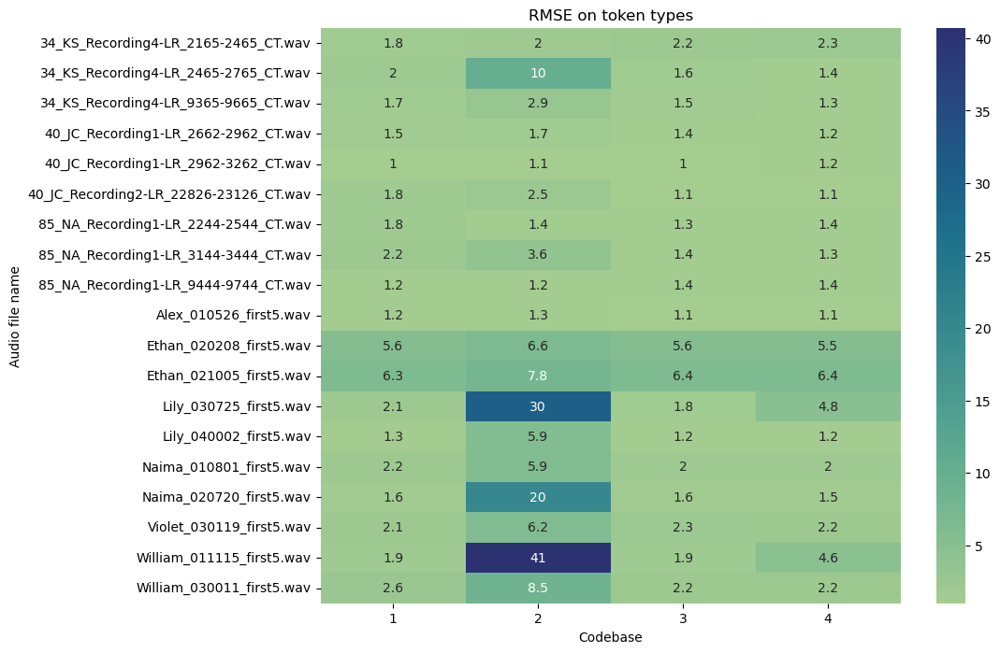

In [41]:
rmse_df = calculateRMSELatest()
plt.figure(figsize=(10,8))
ax= sns.heatmap(rmse_df.pivot(index = "audio", columns = "codebase", values="RMSE"), cmap="crest",annot=True)
ax.set(xlabel="Codebase", ylabel="Audio file name")
plt.title("RMSE on token types")

plt.savefig('RMSE_heatmap.png', format='jpeg',bbox_inches='tight')
plt.show()


## WER calculations

WER = (S + D + I)/N

S is the number of substitutions,
D is the number of deletions,
I is the number of insertions,
N is the number of words in the reference


In [53]:
referencedf = pd.read_csv('/om/user/arjunp/goldTranscripts/34_KS_Recording4-LR_2165-2465_CT-IC.csv')
hypodf = pd.read_csv('/om/user/arjunp/pipelineOutput/1723004242/ashraf/34_KS_Recording4-LR_2165-2465_CT.csv')
reference = referencedf['text'].str.cat(sep=' ')
hypothesis = hypodf['text'].str.cat(sep=' ')
out = jiwer.process_words(jiwer.RemovePunctuation()(reference), jiwer.RemovePunctuation()(hypothesis))
print(jiwer.visualize_alignment(out,skip_correct=True))
print(out.substitutions)
print(out.wer)

#capitalization errors , drop the Xs from REF,




sentence 1
REF: Bah Bah Bah Ow Ow Ow  Ow   I  am    bad mommy  You  see my crack Sorry Something   to feel better better Im just trying   to feel     X for you Come on Come on Come on Come on Come on Come on Dont go come on come on Weeee Come here Tyrell lets   go      get some materials   We      got  to call   DJ      and pawpaw and  say       hi first Why What do you mean      why Mommy why   do       we have  to call     them Because  we didnt     talk  to them today       or yesterday and they     miss   ya they love talking to us you know  that right I know I dont know if they are there I know   that Momma I know them  You   know that they are there Momma Im gonna call them Okay press this button OK press thatv button that button right there This Button  Yea This  Camel  Yea lets see if they are there Okay Hi Hey little smiling boy ** How are you **    X my sister  What did you say My sister gone  Well where is she She Did she go to a party and leave you home No she went to * poo

In [55]:
out.references

[['Bah',
  'Bah',
  'Bah',
  'Ow',
  'Ow',
  'Ow',
  'Ow',
  'I',
  'am',
  'bad',
  'mommy',
  'You',
  'see',
  'my',
  'crack',
  'Sorry',
  'Something',
  'to',
  'feel',
  'better',
  'better',
  'Im',
  'just',
  'trying',
  'to',
  'feel',
  'X',
  'for',
  'you',
  'Come',
  'on',
  'Come',
  'on',
  'Come',
  'on',
  'Come',
  'on',
  'Come',
  'on',
  'Come',
  'on',
  'Dont',
  'go',
  'come',
  'on',
  'come',
  'on',
  'Weeee',
  'Come',
  'here',
  'Tyrell',
  'lets',
  'go',
  'get',
  'some',
  'materials',
  'We',
  'got',
  'to',
  'call',
  'DJ',
  'and',
  'pawpaw',
  'and',
  'say',
  'hi',
  'first',
  'Why',
  'What',
  'do',
  'you',
  'mean',
  'why',
  'Mommy',
  'why',
  'do',
  'we',
  'have',
  'to',
  'call',
  'them',
  'Because',
  'we',
  'didnt',
  'talk',
  'to',
  'them',
  'today',
  'or',
  'yesterday',
  'and',
  'they',
  'miss',
  'ya',
  'they',
  'love',
  'talking',
  'to',
  'us',
  'you',
  'know',
  'that',
  'right',
  'I',
  'know',
  'I

In [54]:
out.alignments

#use this and the tokenized version; calculate Lev dist for each pair; distribution over each pair 

[[AlignmentChunk(type='delete', ref_start_idx=0, ref_end_idx=3, hyp_start_idx=0, hyp_end_idx=0),
  AlignmentChunk(type='equal', ref_start_idx=3, ref_end_idx=5, hyp_start_idx=0, hyp_end_idx=2),
  AlignmentChunk(type='substitute', ref_start_idx=5, ref_end_idx=14, hyp_start_idx=2, hyp_end_idx=11),
  AlignmentChunk(type='equal', ref_start_idx=14, ref_end_idx=16, hyp_start_idx=11, hyp_end_idx=13),
  AlignmentChunk(type='substitute', ref_start_idx=16, ref_end_idx=27, hyp_start_idx=13, hyp_end_idx=24),
  AlignmentChunk(type='delete', ref_start_idx=27, ref_end_idx=29, hyp_start_idx=24, hyp_end_idx=24),
  AlignmentChunk(type='equal', ref_start_idx=29, ref_end_idx=31, hyp_start_idx=24, hyp_end_idx=26),
  AlignmentChunk(type='delete', ref_start_idx=31, ref_end_idx=43, hyp_start_idx=26, hyp_end_idx=26),
  AlignmentChunk(type='equal', ref_start_idx=43, ref_end_idx=45, hyp_start_idx=26, hyp_end_idx=28),
  AlignmentChunk(type='delete', ref_start_idx=45, ref_end_idx=48, hyp_start_idx=28, hyp_end_idx=2

In [41]:
def calculateWERLatest():
    '''
    Function to calculate the Word Error Rate (WER) for the latest run of the pipeline
    Each (codebase, audiofile) pair has a WER score, SR, IR, DR, HR
    '''

    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_filepaths = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files =  [os.path.basename(file)[:-4]  for file in list_of_filepaths] 
    list_of_audio =  [name+".wav" for name in list_of_files]
    #list_of_gold_transcripts = [os.path.join('/om/user/arjunp/goldTranscripts',name+".csv") for name in list_of_files]
    N = len(list_of_filepaths)

    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv"))

    cb_df = []
 
    wer_df = []
    subs = []
    ins = []
    hits = []
    dels = []

    
    for i in range(N):
            referencedf = pd.read_csv(list_of_gold_transcripts[i])
            hypodf = pd.read_csv(list_of_filepaths[i])
            reference = referencedf['text'].str.cat(sep=' ')
            hypothesis = hypodf['text'].str.cat(sep=' ')
            out = jiwer.process_words(jiwer.RemovePunctuation()(reference), jiwer.RemovePunctuation()(hypothesis))
            wer_df.append(out.wer)
            cb_df.append(1+codebasenameoptions.index(os.path.basename(os.path.split(list_of_filepaths[i])[0])))
             
            subs.append(out.substitutions)
            ins.append(out.insertions)
            hits.append(out.hits)
            dels.append(out.deletions)


    df   = pd.DataFrame(list(zip(cb_df, list_of_audio, wer_df, subs, dels, ins,hits)), columns =['codebase', 'audio', 'WER','substitutions','deletions','insertions','hits'])
    df['N_ref'] = df['substitutions'] + df['deletions'] + df['hits']
    df['substitution_rate'] = df['substitutions']/df['N_ref'] 
    df['deletion_rate'] = df['deletions']/df['N_ref']
    df['insertion_rate'] = df['insertions']/df['N_ref']
    df['hit_rate'] = df['hits']/df['N_ref']
    df.to_csv('WER_'+latest_timestamp+'.csv', index=False)
    return df 

In [42]:
wer_df = calculateWERLatest()

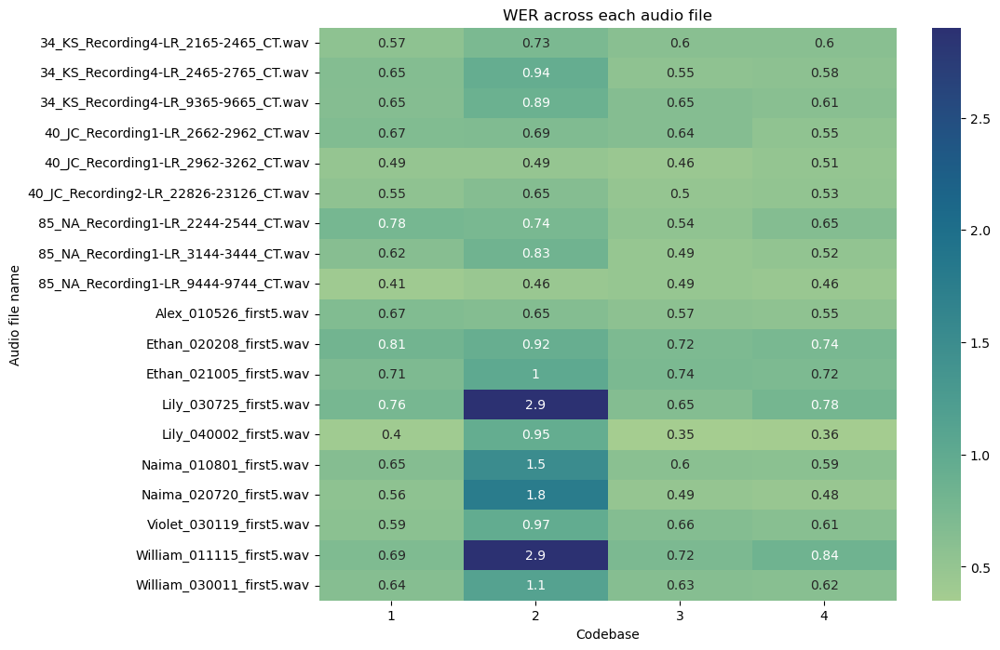

In [23]:
plt.figure(figsize=(10,8))
ax= sns.heatmap(wer_df.pivot(index = "audio", columns = "codebase", values="WER"), cmap="crest",annot=True)
ax.set(xlabel="Codebase", ylabel="Audio file name")
plt.title("WER across each audio file")
plt.savefig('WER_heatmap.png', format='jpeg',bbox_inches='tight')
plt.show()


# swarmplot for this WER

## Detailed metrics from WER calculations

In [7]:
wer_df

,codebase,audio,WER,substitutions,deletions,insertions,hits,N_ref,substitution_rate,deletion_rate,insertion_rate,hit_rate
0,3,Lily_030725_first5.wav,0.533333,79,73,16,163,315,0.250794,0.231746,0.050794,0.517460
1,3,34_KS_Recording4-LR_2165-2465_CT.wav,0.517073,121,73,18,216,410,0.295122,0.178049,0.043902,0.526829
2,3,Ethan_021005_first5.wav,0.648980,133,158,27,199,490,0.271429,0.322449,0.055102,0.406122
3,3,85_NA_Recording1-LR_2244-2544_CT.wav,0.466125,132,30,10,207,369,0.357724,0.081301,0.027100,0.560976
4,3,William_030011_first5.wav,0.475806,148,135,12,337,620,0.238710,0.217742,0.019355,0.543548
...,...,...,...,...,...,...,...,...,...,...,...,...
71,1,Naima_020720_first5.wav,0.452191,104,99,24,299,502,0.207171,0.197211,0.047809,0.595618
72,1,Alex_010526_first5.wav,0.480000,50,6,16,94,150,0.333333,0.040000,0.106667,0.626667
73,1,40_JC_Recording1-LR_2662-2962_CT.wav,0.555035,50,20,167,357,427,0.117096,0.046838,0.391101,0.836066
74,1,Violet_030119_first5.wav,0.445217,155,100,1,320,575,0.269565,0.173913,0.001739,0.556522


In [45]:
melted_wer_df = pd.melt(wer_df, id_vars=['codebase','audio'], value_vars=['substitution_rate', 'deletion_rate','insertion_rate','hit_rate'], var_name='performance metric', value_name='value')

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


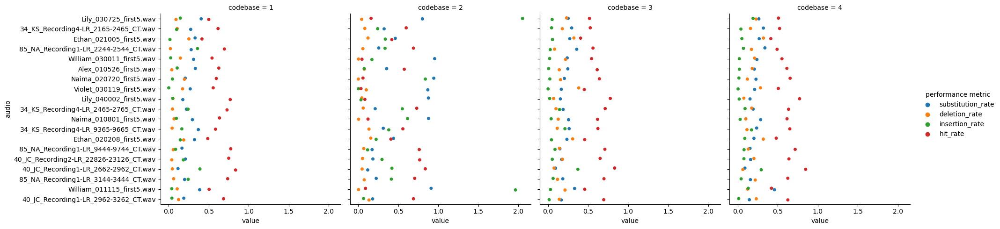

In [23]:
sns.catplot(data=melted_wer_df, x="value", y='audio' , hue="performance metric", col="codebase", aspect=1, kind ='strip')

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


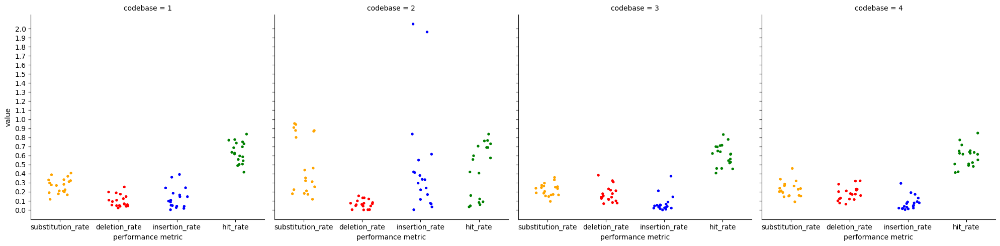

In [49]:
g = sns.catplot(data=melted_wer_df, x="performance metric", y='value', hue="performance metric", col="codebase", aspect=1,kind ='strip',palette=['orange','red','blue','green'] ,jitter=0.2, s=15)
for ax in g.axes.flat:
    ax.set_yticks(np.arange(0,2.1,0.1))

In [120]:
melted_wer_df['source'] = np.where(melted_wer_df['audio'].str[-5:]=="5.wav","Providence corpus","LENA dataset")

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


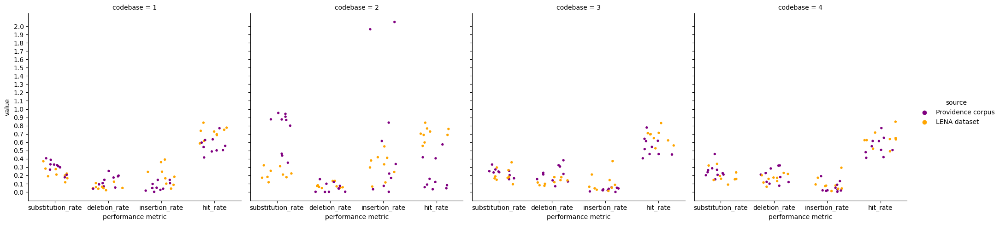

In [71]:
g = sns.catplot(data=melted_wer_df, x="performance metric", y='value', hue="source", col="codebase", aspect=1,kind ='strip',palette=['purple','orange'] ,jitter=0.3, s=15)
for ax in g.axes.flat:
    ax.set_yticks(np.arange(0,2.1,0.1))

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


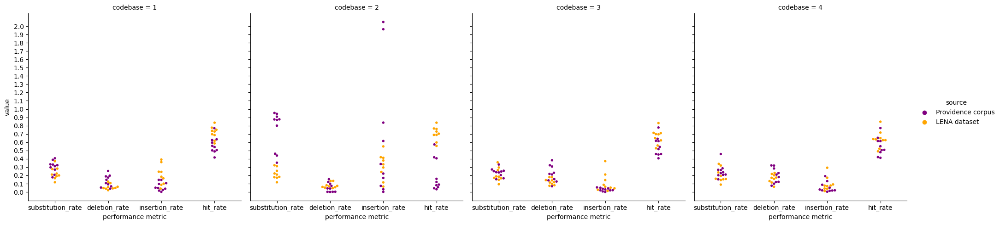

In [49]:
g = sns.catplot(data=melted_wer_df, x="performance metric", y='value', hue="source", col="codebase", aspect=1,kind ='swarm',palette=['purple','orange'] ,  s=15)
for ax in g.axes.flat:
    ax.set_yticks(np.arange(0,2.1,0.1))

# reference-
sns.catplot(data=df, x="age", y="class", kind="violin", color=".9", inner=None)
sns.swarmplot(data=df, x="age", y="class", size=3)

/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x800 with 0 Axes>

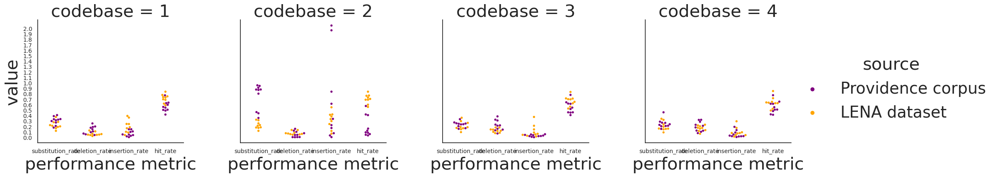

In [136]:
plt.figure(figsize=(10,8))
g = sns.catplot(data=melted_wer_df, x="performance metric", y='value', hue="source", col="codebase", aspect=1,kind ='swarm',palette=['purple','orange'] ,  s=15)
for ax in g.axes.flat:
    ax.set_yticks(np.arange(0,2.1,0.1))
plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10) 
plt.show()
# reference-
#sns.catplot(data=df, x="age", y="class", kind="violin", color=".9", inner=None)
#sns.swarmplot(data=df, x="age", y="class", size=3)

## Speaker count evaluation

In [26]:
def howManySpeakers(filepath,goldpath):
    modelcsv = pd.read_csv(filepath)
    goldcsv = pd.read_csv(goldpath)
    unique_speakers_model =  modelcsv['speaker'].nunique()
    try:
        unique_speakers_gold =  goldcsv['speaker_role'].nunique()
    except:
        unique_speakers_gold =  goldcsv['speaker'].nunique()
    return unique_speakers_model, unique_speakers_gold
     

In [109]:
def speakerCountsPlots():
    latest_timestamp = str(extractLatestTimestamp())
    time_directory = os.path.join('/om/user/arjunp/pipelineOutput',latest_timestamp)
    list_of_filepaths = glob.glob(os.path.join(time_directory, '**/*.csv'), recursive=True)
    list_of_files =  [os.path.basename(file)[:-4]  for file in list_of_filepaths] 
    list_of_audio =  [name+".wav" for name in list_of_files]
    #list_of_gold_transcripts = [os.path.join('/om/user/arjunp/goldTranscripts',name+".csv") for name in list_of_files]
    N = len(list_of_filepaths)
    modelvalues = []
    goldvalues = []
    cb_df=[]

    list_of_gold_transcripts = []
    for name in list_of_files:
        if os.path.exists(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv")):
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+"-IC.csv"))
        else:
            list_of_gold_transcripts.append(os.path.join('/om/user/arjunp/goldTranscripts', name+".csv"))
    for i in range(N):
        model,gold = howManySpeakers(list_of_filepaths[i], list_of_gold_transcripts[i])
        modelvalues.append(model)
        goldvalues.append(gold)
        cb_df.append(1+codebasenameoptions.index(os.path.basename(os.path.split(list_of_filepaths[i])[0])))

    speaker_counts_df = pd.DataFrame(list(zip(list_of_audio,cb_df,modelvalues,goldvalues)), columns =['audio', 'codebase','cb_speakers', 'gold_speakers']) 
    speaker_counts_df['residual'] = -1*speaker_counts_df['cb_speakers'] + speaker_counts_df['gold_speakers']


    speaker_counts_df['source'] = np.where(speaker_counts_df['audio'].str[-5:]=="5.wav","Providence corpus","LENA dataset")
    speaker_counts_df['codebase_name'] = speaker_counts_df['codebase'].map(codebase_mapping_dict)
    
    g = sns.catplot(data=sc ,y='residual', col="codebase_name",hue='source',   aspect=0.5,kind ='swarm',palette=['purple','orange','red','green'] ,  s=55)
    for ax in g.axes.flat:
        ax.set_yticks(np.arange(-4,6,1))

    g.fig.suptitle('Residuals of # of distinct speakers in audio')
    g.set(ylabel='Residual (= True value - Model value)')
    plt.subplots_adjust(top=0.8)

    speaker_counts_df.to_csv('speaker_counts_'+latest_timestamp+'.csv', index=False)
    plt.savefig( 'speaker_counts_'+latest_timestamp+'.png', format='png',bbox_inches='tight')
    plt.show()
    return speaker_counts_df

/tmp/ipykernel_2168283/1582797813.py:32: UserWarning: The palette list has more values (4) than needed (2), which may not be intended.
  g = sns.catplot(data=sc ,y='residual', col="codebase_name",hue='source',   aspect=0.5,kind ='swarm',palette=['purple','orange','red','green'] ,  s=55)
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/cm/shared/openmind8/anaconda/3-2023.09-0/lib/python3.11/site-packages/seaborn/categorical.py:3544: UserWarning: 5.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


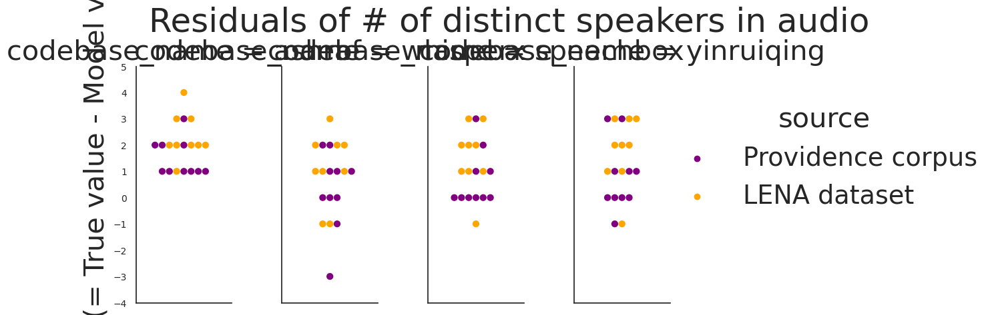

,audio,codebase,cb_speakers,gold_speakers,residual,source,codebase_name
0,Lily_030725_first5.wav,3,2,4,2,Providence corpus,ashraf
1,34_KS_Recording4-LR_2165-2465_CT.wav,3,1,3,2,LENA dataset,ashraf
2,Ethan_021005_first5.wav,3,1,2,1,Providence corpus,ashraf
3,85_NA_Recording1-LR_2244-2544_CT.wav,3,1,4,3,LENA dataset,ashraf
4,William_030011_first5.wav,3,1,3,2,Providence corpus,ashraf
...,...,...,...,...,...,...,...
71,Naima_020720_first5.wav,1,1,2,1,Providence corpus,yinruiqing
72,Alex_010526_first5.wav,1,1,2,1,Providence corpus,yinruiqing
73,40_JC_Recording1-LR_2662-2962_CT.wav,1,4,3,-1,LENA dataset,yinruiqing
74,Violet_030119_first5.wav,1,1,4,3,Providence corpus,yinruiqing


In [138]:
createLatestPlots('speaker-counts')